# <font color='purple'>FUNOVA Preprocessing QC statistics </font> 
### January 2025

In [21]:
import os
NOVA_HOME = "/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA"
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/FUNOVA'

LOGS_PATH = os.path.join(NOVA_DATA_HOME, "outputs/preprocessing/logs/")
PLOT_PATH = os.path.join(NOVA_DATA_HOME, "outputs/logs/")

os.chdir(NOVA_HOME)

import pandas as pd
import numpy as np
import contextlib
import io
from IPython.display import display, Javascript
import seaborn as sns
from tools.preprocessing_tools.qc_reports.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new, plot_marker_data, find_bad_wells,\
                                                show_site_survival_by_brenner_on_dapi_tiles, show_site_survival_target_brenner_tiles
                                                
from tools.preprocessing_tools.qc_reports.qc_config import (
    funova_markers as markers,
    funova_cell_lines as cell_lines,
    funova_cell_lines_to_cond as cell_lines_to_cond,
    funova_cell_lines_for_disp as cell_lines_for_disp,
    funova_reps as reps,
    funova_line_colors as line_colors,
    funova_lines_order as lines_order,
    funova_custom_palette as custom_palette,
    funova_expected_dapi_raw as expected_dapi_raw,
    funova_panels as panels,
    funova_marker_info as marker_info
)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# choose batches
batches = ['Batch3', 'Batch4']#, 'batch2', 'batch3']
batches

['Batch3', 'Batch4']

I have created a folder called 'Batch3' in the logs dir and put all files inside

In [4]:
validate_antibody = False

In [5]:
df = log_files_qc(LOGS_PATH, batches, only_wt_cond = False)

reading logs of Batch3

Total of 1 files were read.
Before dup handeling  (172504, 22)
After duplication removal #1: (172504, 23)
After duplication removal #2: (172504, 23)


In [6]:
df['filename'] = df['filename'].str.split('-').str[0]
df['site_num'] = df['site_num'].str.split('-').str[0]

In [7]:
df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']

## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

In [8]:
root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw')

In [9]:
# # Create the marker info dfs

# import os
# import pandas as pd

# # Define the root path
# root_path = "/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/raw/"

# # Initialize a dictionary to store the data
# data = {}

# # Walk through the directory structure
# for dirpath, dirnames, filenames in os.walk(root_path):
#     # Check if the current path contains 'repX' and a subfolder for the marker
#     if os.path.basename(os.path.dirname(dirpath)).startswith("rep"):  # Check for 'repX' in parent folder
#         if "Batch3" in dirpath or "Batch4" in dirpath:  # Check if the path contains "Batch3" or "Batch4"
#             marker = os.path.basename(dirpath)  # The marker is the current folder
#             panel_folder = os.path.basename(os.path.dirname(os.path.dirname(os.path.dirname(dirpath))))  # Three levels up for the panel
#             if panel_folder.lower().startswith("panel"):  # Ensure it's a panel folder
#                 panel = panel_folder.replace("panel", "").strip()

#                 # Add marker and panel information
#                 if marker not in data:
#                     data[marker] = {"Antibody": [], "panel": []}  # Initialize marker entry
#                 data[marker]["panel"].append(panel)  # Add panel to the marker

# # Convert the data to a DataFrame
# final_marker_info = pd.DataFrame.from_dict(data, orient="index")

# # Ensure 'panel' and 'Antibody' are arrays and unique panels
# final_marker_info["panel"] = final_marker_info["panel"].apply(lambda x: sorted(set(x)))  # Remove duplicates and sort
# final_marker_info["Antibody"] = [[] for _ in range(len(final_marker_info))]  # Ensure Antibody is an empty array

Batch3
Folder structure is valid.
No bad files are found.
Total Sites:  118400


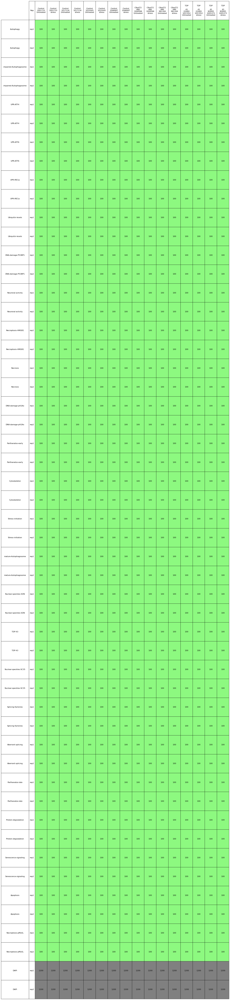

Batch4
Folder structure is valid.
No bad files are found.
Total Sites:  118400


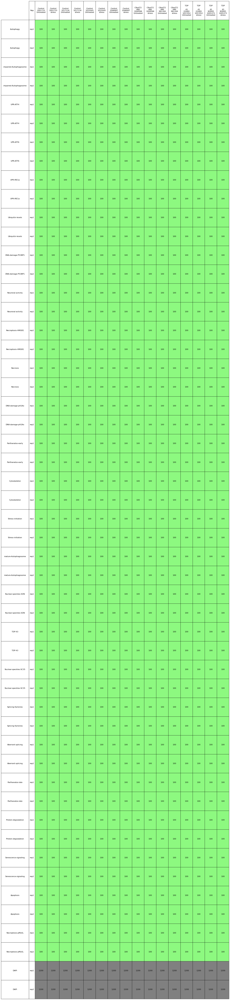

In [10]:
batches_raw = [batch.replace("_16bit_no_downsample","") for batch in batches]
raws = run_validate_folder_structure(root_directory_raw, False, panels, markers.copy(), PLOT_PATH, marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=batches_raw, fig_width=8,fig_height = 40,
                                    expected_count=100, validate_antibody = validate_antibody)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

Batch3
Folder structure is valid.
1152 files are bad:
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch3/Control-1001733/Untreated/UPR-ATF4, rep1_r05c05f52-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch3/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f07-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch3/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f28-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch3/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f08-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch3/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f16-ch3t1_panelC_Control-1001733_processed.npy small size (0

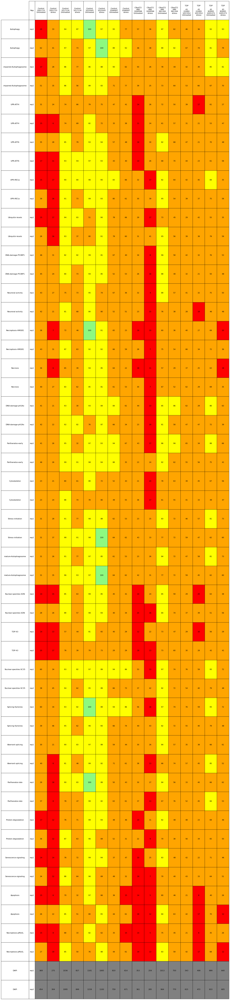

Batch4
Folder structure is valid.
1382 files are bad:
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1001733/Untreated/impaired-Autophagosome, rep2_r05c08f49-ch3t1_panelD_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1001733/Untreated/impaired-Autophagosome, rep1_r05c07f64-ch3t1_panelD_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f07-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f38-ch3t1_panelC_Control-1001733_processed.npy small size (0.128 kB)
/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1001733/Untreated/UPR-ATF4, rep2_r05c06f100-ch3t1_panelC_Control-100173

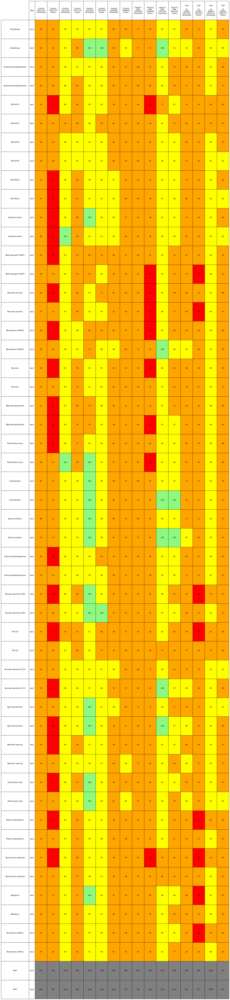

In [11]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed')
procs = run_validate_folder_structure(root_directory_proc, True, panels, markers, PLOT_PATH, marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=batches, fig_width=8,fig_height = 40,
                                    expected_count=100, validate_antibody = validate_antibody)

### Difference between Raw and Processed

Batch3


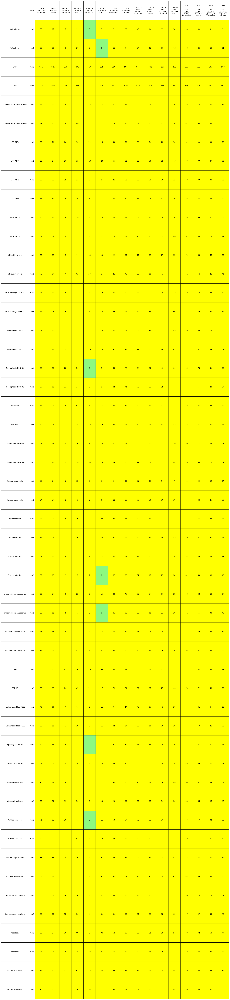

Batch4


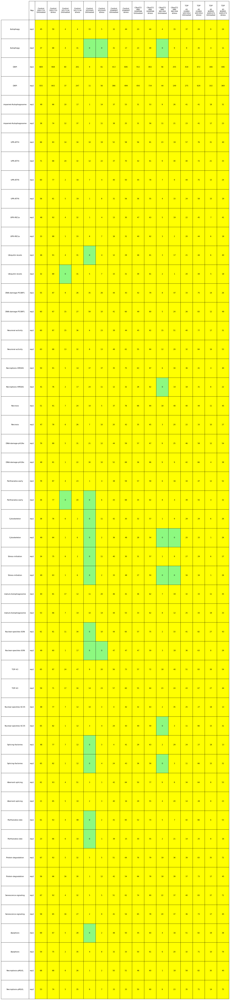

In [12]:
display_diff(batches, raws, procs, PLOT_PATH, fig_width=8, fig_height = 40)

### Variance in each batch (of processed files)

In [13]:
for batch in batches:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, cond_count=1, rep_count=len(reps), 
                                       num_markers=len(markers))
    print(f'{batch} var: ',var)

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/galavir/.conda/envs

/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Col

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs

/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Col

Batch3 var:  nan


/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python

/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Col

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs

/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:29: RuntimeWarning: Mean of empty slice.
  tiles_var = np.var(x, axis=(1,2)).mean()
/home/labs/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/labs/hornsteinlab/Col

Batch4 var:  nan


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

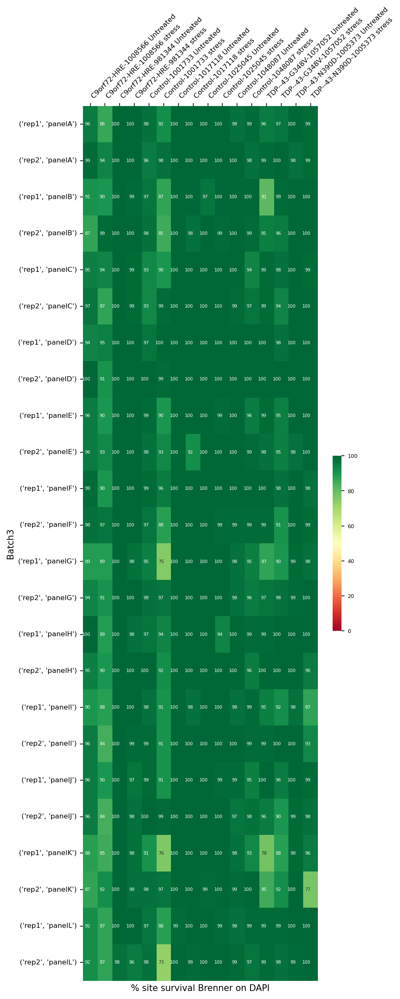

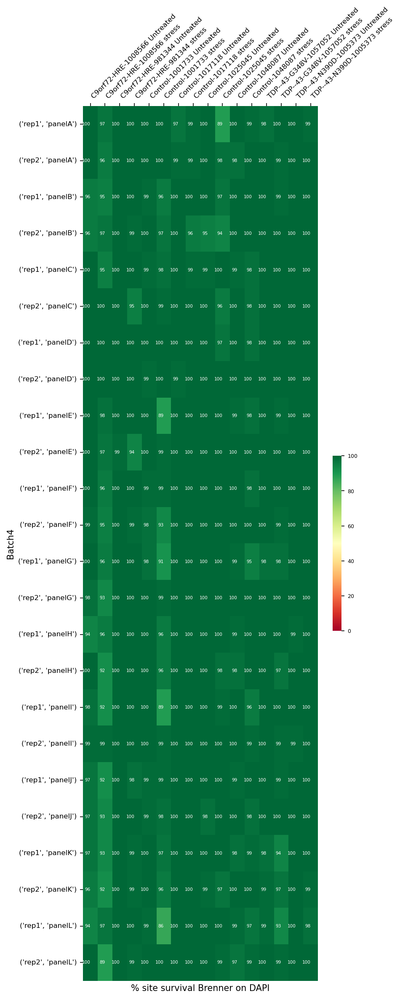

In [14]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,batches, line_colors, panels,
                                                        figsize=(6,18), reps=reps, vmax=100)

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

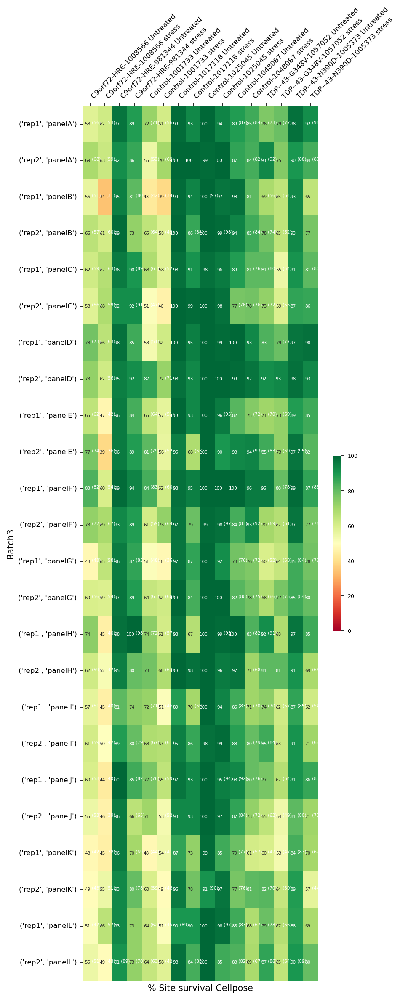

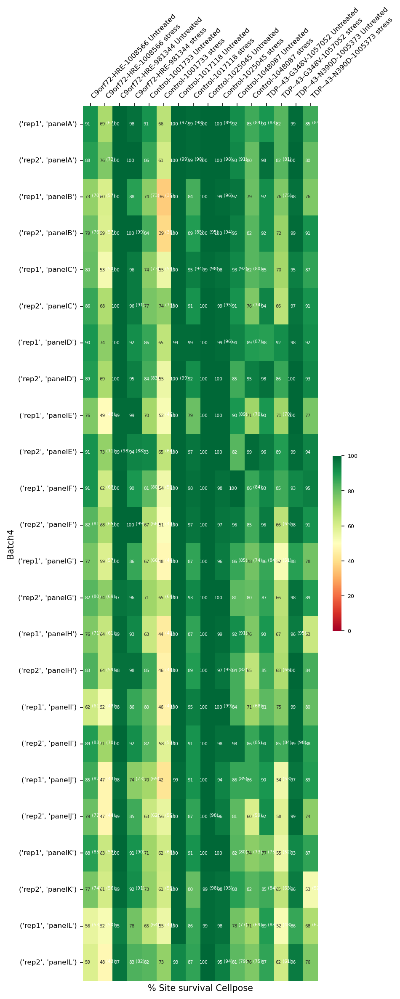

In [15]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, batches, dapi_filter_by_brenner, 
                                                           line_colors, panels, figsize=(6,18), reps=reps)

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least 85% of a cell that Cellpose detected.**

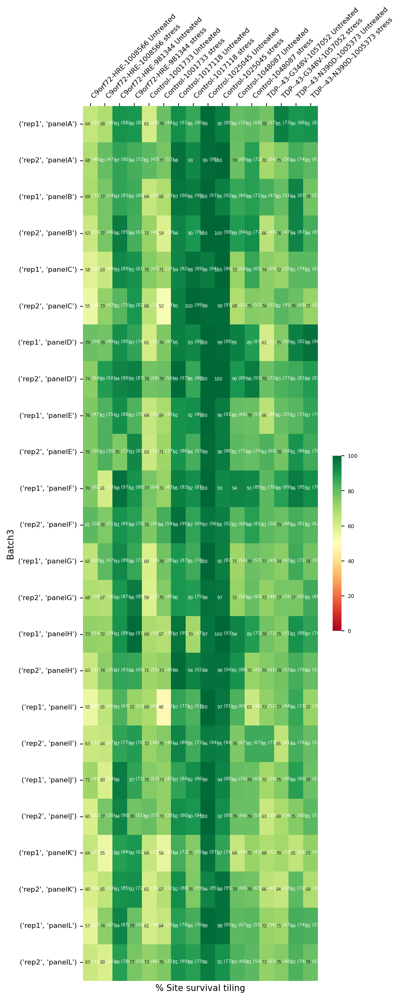

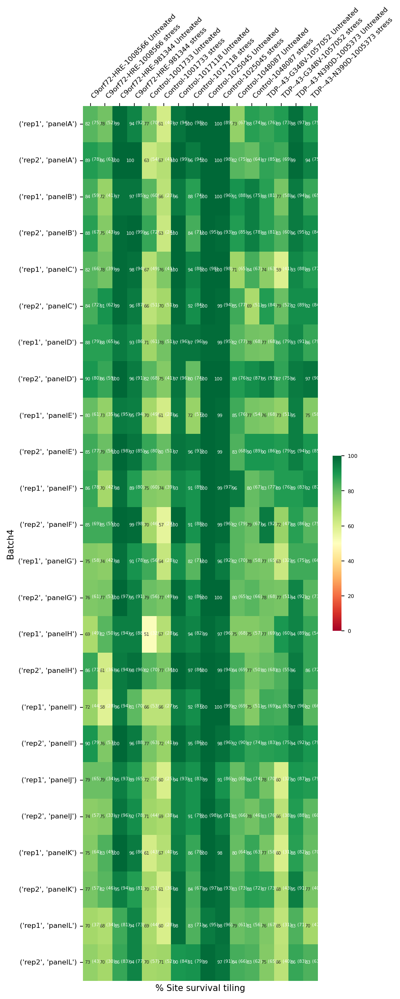

In [16]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, batches, dapi_filter_by_cellpose, 
                                                     line_colors, panels, figsize=(6,18), reps=reps)

### 4. % Site survival after Brenner on DAPI's tiles
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

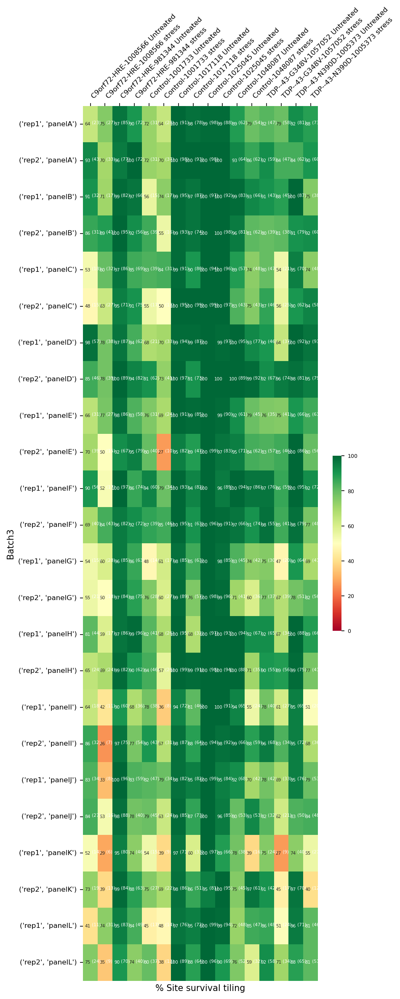

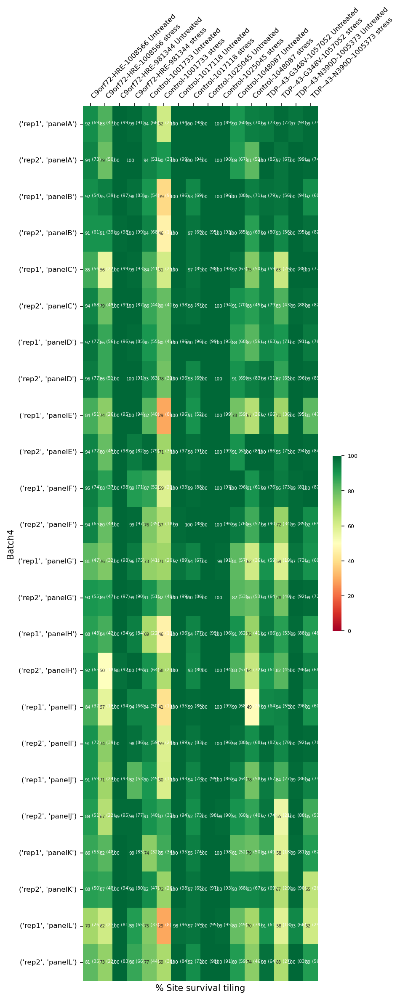

In [17]:
dapi_filter_by_brenner_tiles=show_site_survival_by_brenner_on_dapi_tiles(df_dapi, batches, dapi_filter_by_tiling, 
                                                     line_colors, panels, figsize=(6,18), reps=reps)

### 5. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

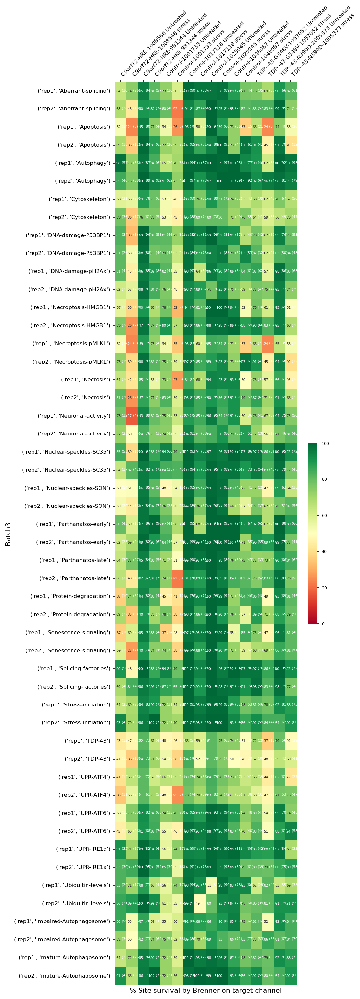

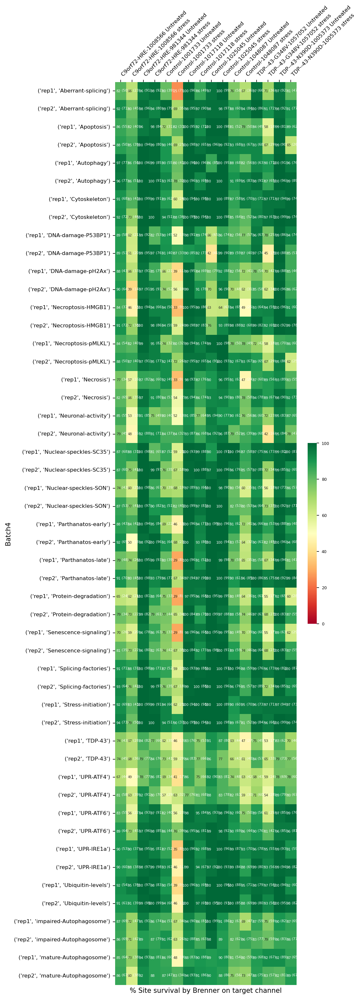

In [18]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling,
                                 figsize=(6,24), markers=markers)

In [22]:
df_dapi.iloc[np.where(df_dapi['n_valid_tiles']-df_dapi['n_valid_tiles_after_tiles_brenner'])][['n_valid_tiles','n_valid_tiles_after_tiles_brenner']]

,n_valid_tiles,n_valid_tiles_after_tiles_brenner
54254,1,0.0
54275,2,0.0
54274,1,0.0
54223,3,0.0
54293,1,0.0
...,...,...
111468,4,3.0
111383,1,0.0
111411,4,3.0
111650,1,0.0


Find non valid wells

In [23]:
dfb = pd.read_csv("/home/labs/hornsteinlab/Collaboration/FUNOVA/outputs/preprocessing/brenner/raw_metrics280125_exp3.csv")
# Extract the panel (e.g., "panelD") from the Path column
dfb['Panel'] = dfb['Path'].str.extract(r'/panel([A-Z])/', expand=True)
find_bad_wells(dfb, threshold=10000, percentage_filter=60)

,CellLine,Marker,Count_table1,Count_table2,Percentage,Combination,Panel,Condition,Rep,Batch
0,Control_1017118,Aberrant-splicing,580,800,72.50,"['CellLine', 'Marker']",NaN,NaN,NaN,NaN
1,Control_1017118,Aberrant-splicing,580,800,72.50,"['Panel', 'CellLine', 'Marker']",E,NaN,NaN,NaN
2,Control_1017118,Aberrant-splicing,318,400,79.50,"['Condition', 'CellLine', 'Marker']",NaN,Untreated,NaN,NaN
3,Control_1017118,DNA-damage-pH2Ax,306,400,76.50,"['Condition', 'CellLine', 'Marker']",NaN,Untreated,NaN,NaN
4,C9orf72-HRE_981344,DNA-damage-P53BP1,273,400,68.25,"['Condition', 'CellLine', 'Marker']",NaN,stress,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
188,C9orf72-HRE_1008566,Senescence-signaling,98,100,98.00,"['Panel', 'Condition', 'CellLine', 'Rep', 'Bat...",L,stress,rep1,Batch2
189,C9orf72-HRE_981344,DAPI,91,100,91.00,"['Panel', 'Condition', 'CellLine', 'Rep', 'Bat...",L,stress,rep1,Batch2
190,C9orf72-HRE_981344,Protein-degradation,93,100,93.00,"['Panel', 'Condition', 'CellLine', 'Rep', 'Bat...",L,stress,rep1,Batch2
191,C9orf72-HRE_981344,Senescence-signaling,93,100,93.00,"['Panel', 'Condition', 'CellLine', 'Rep', 'Bat...",L,stress,rep1,Batch2


### 6. % Site survival after Brenner on target channel tiles
Percentage out of the tiles that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

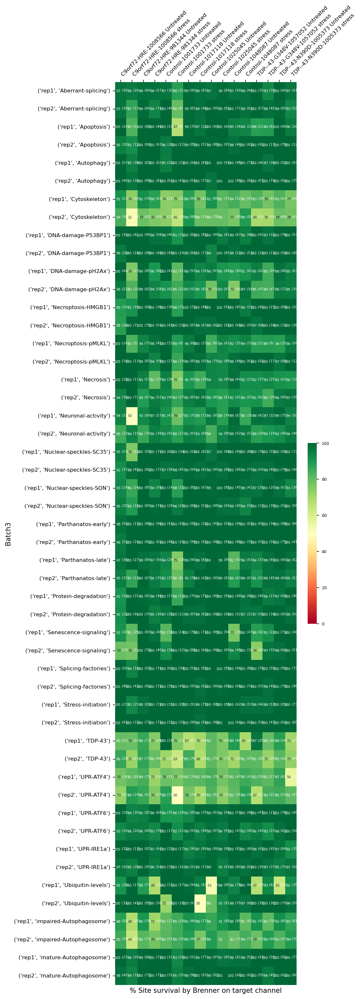

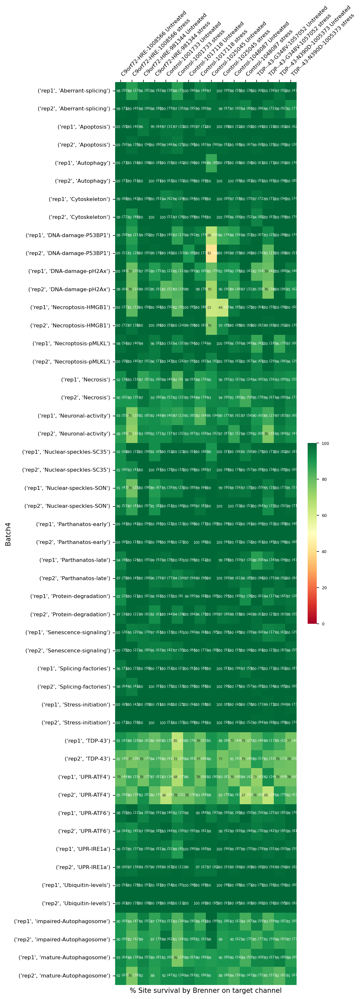

In [24]:
show_site_survival_target_brenner_tiles(df_dapi, df_target, dapi_filter_by_brenner_tiles,
                                 figsize=(6,24), markers=markers)

## Statistics About the Processed Files

In [25]:
names = ['Total number of tiles', 'Total number of whole cells']
stats = ['n_valid_tiles_after_tiles_brenner','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, markers)

In [26]:
total_sum.rename(columns={'n_valid_tiles_after_tiles_brenner': 'n_valid_tiles'}, inplace=True)

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


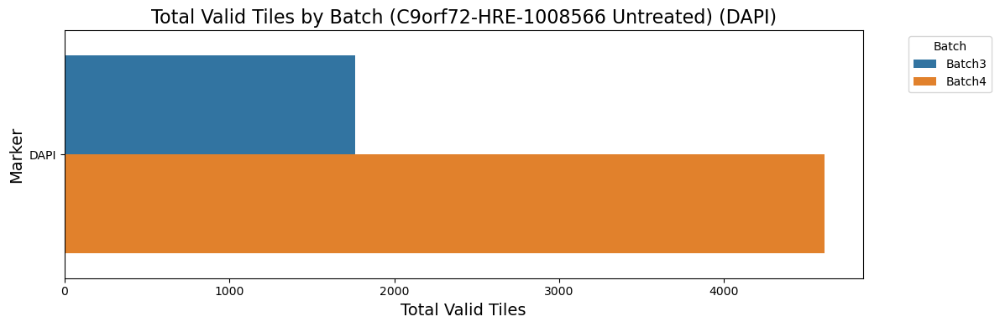

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


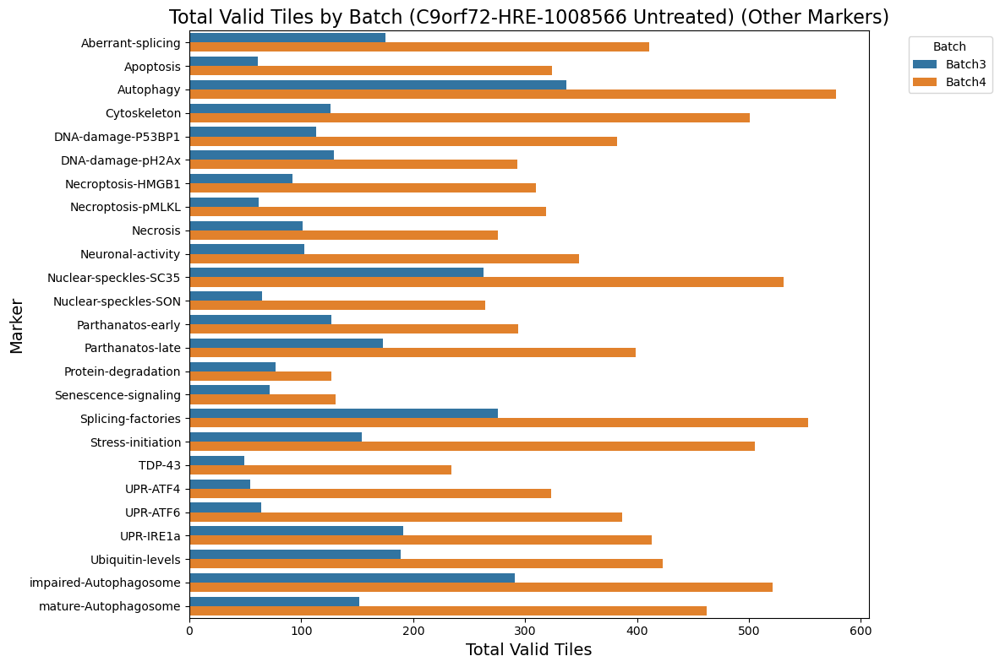

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


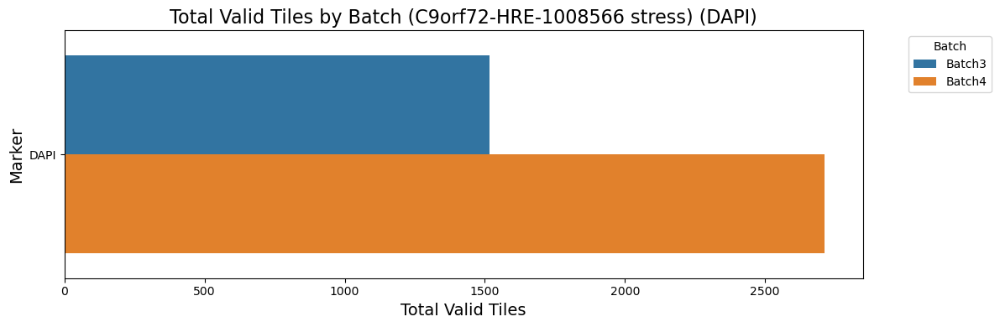

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


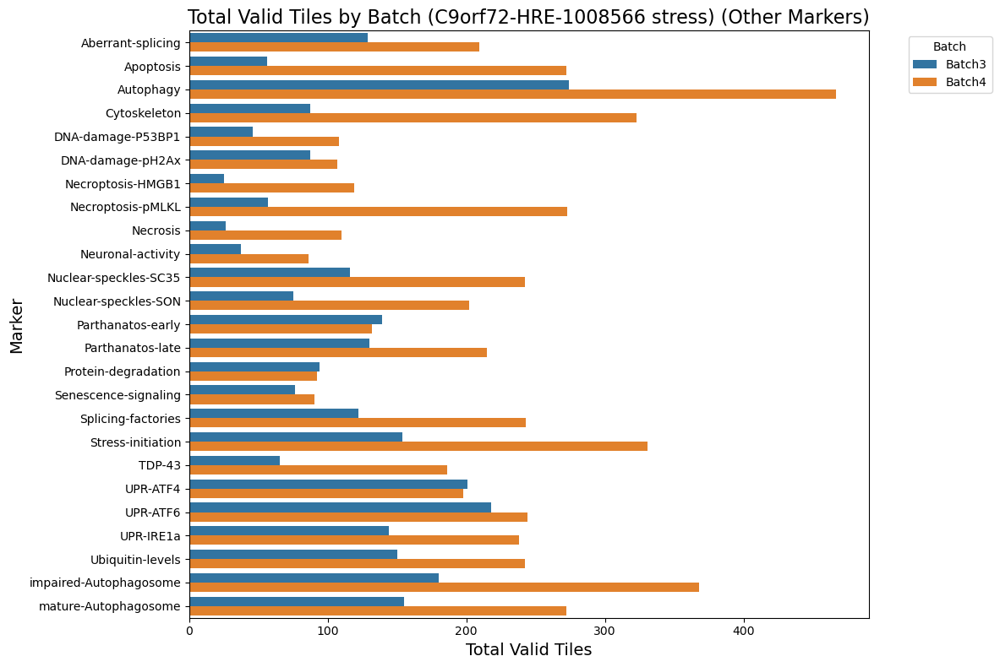

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


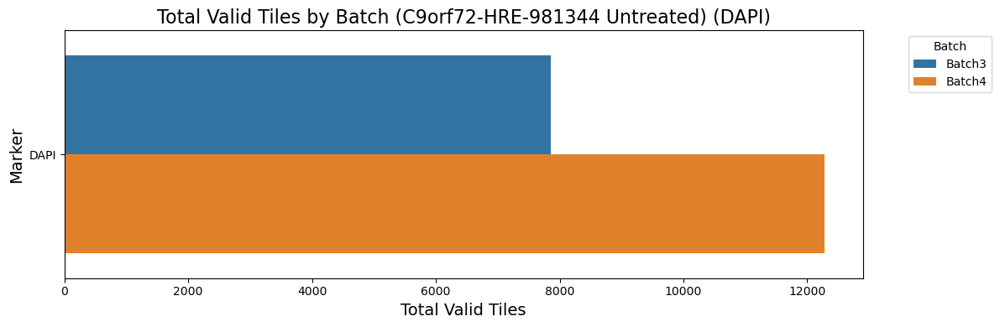

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


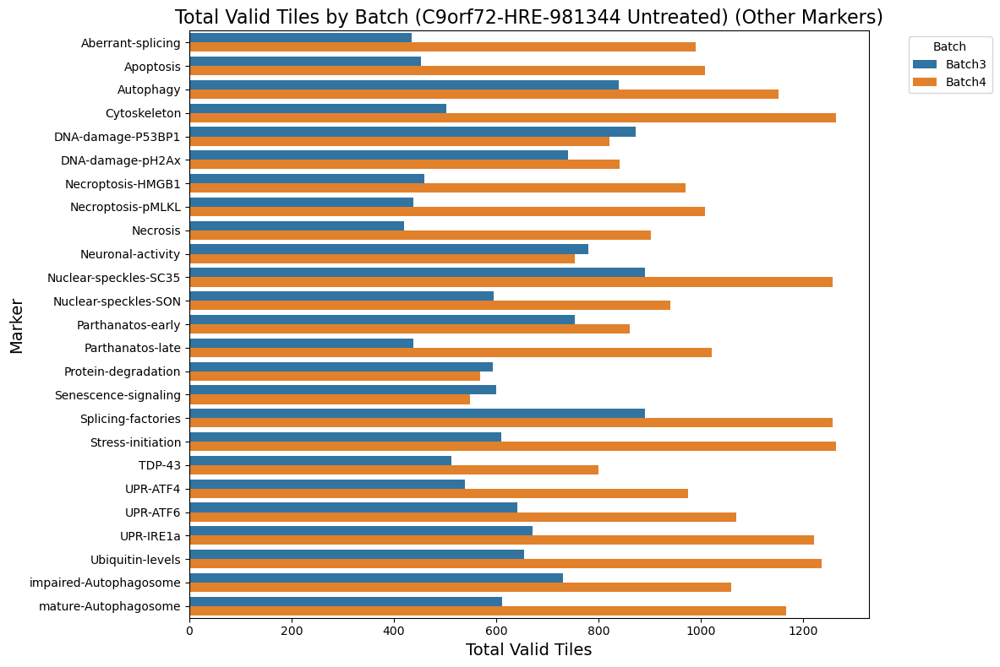

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


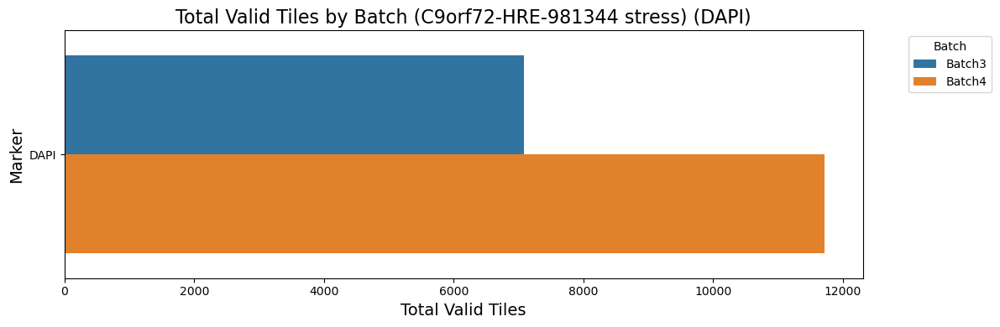

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


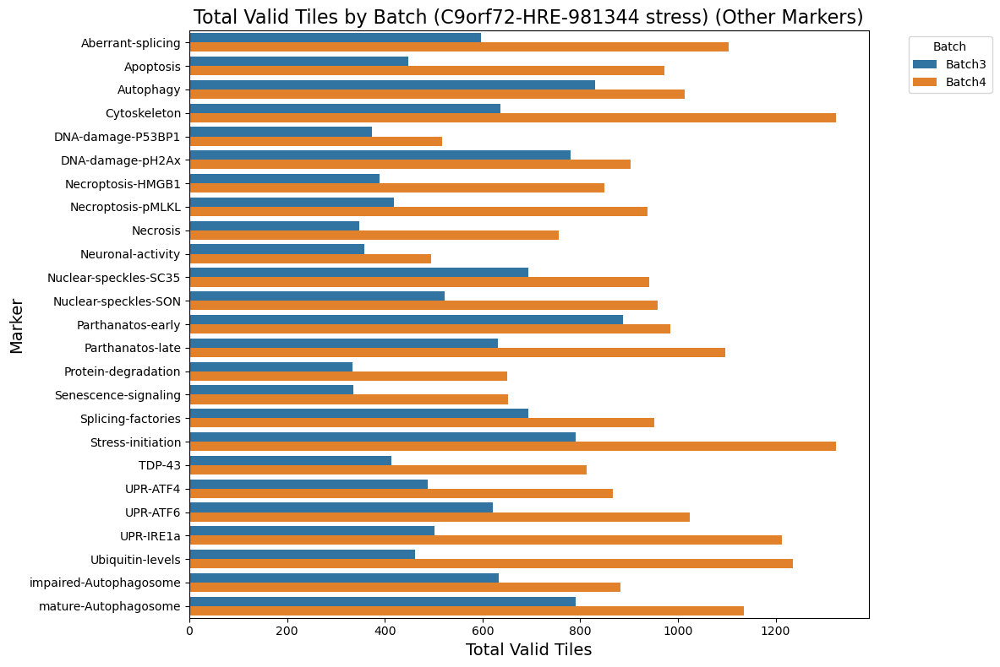

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


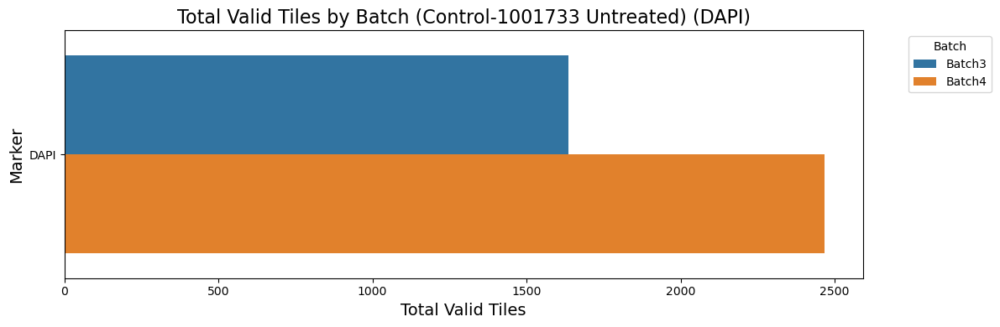

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


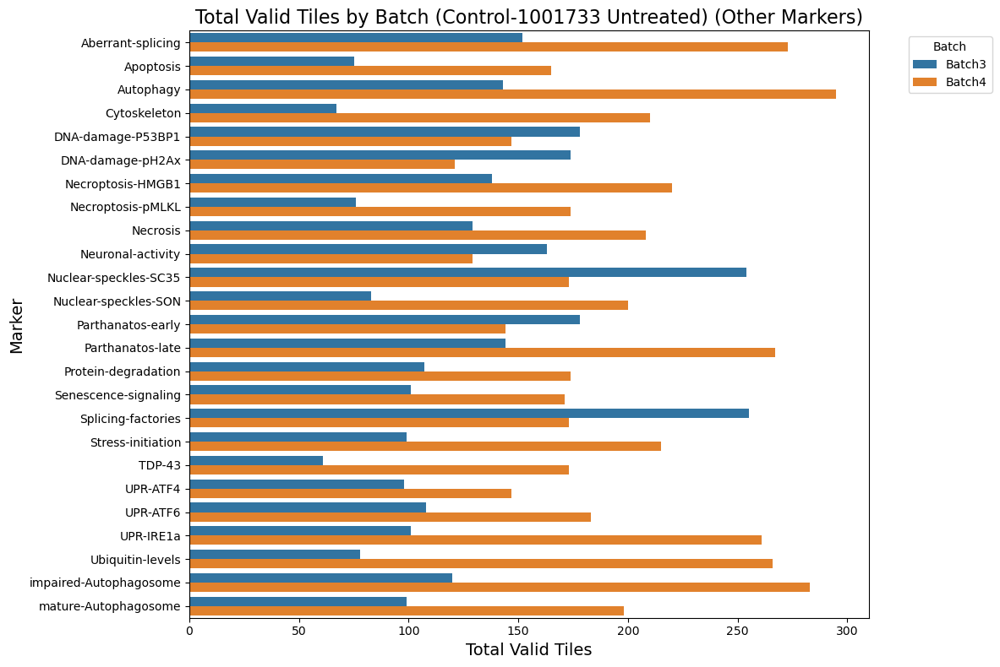

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


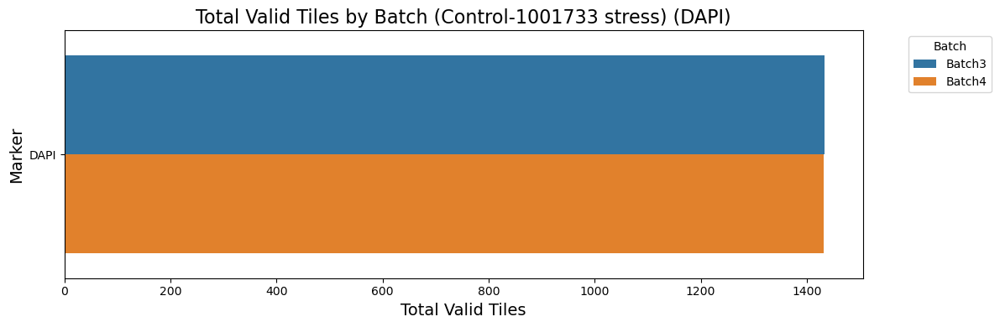

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


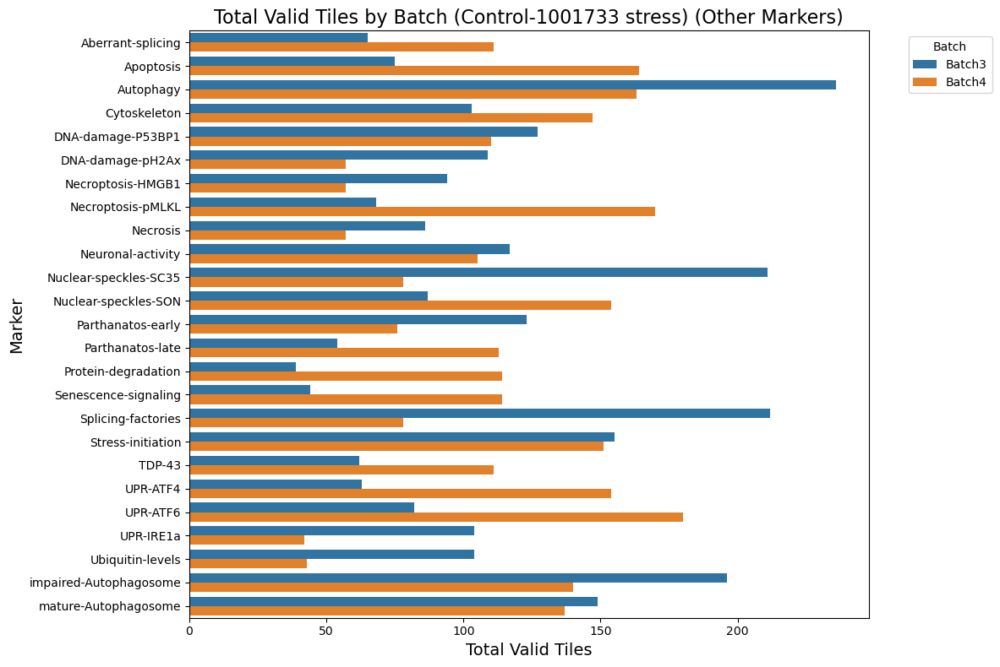

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


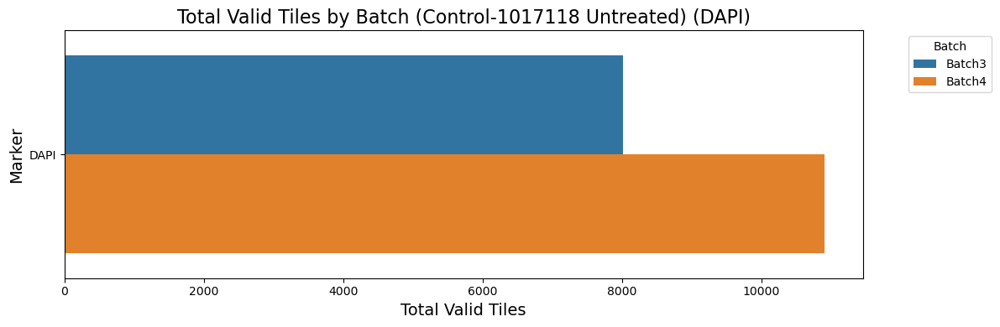

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


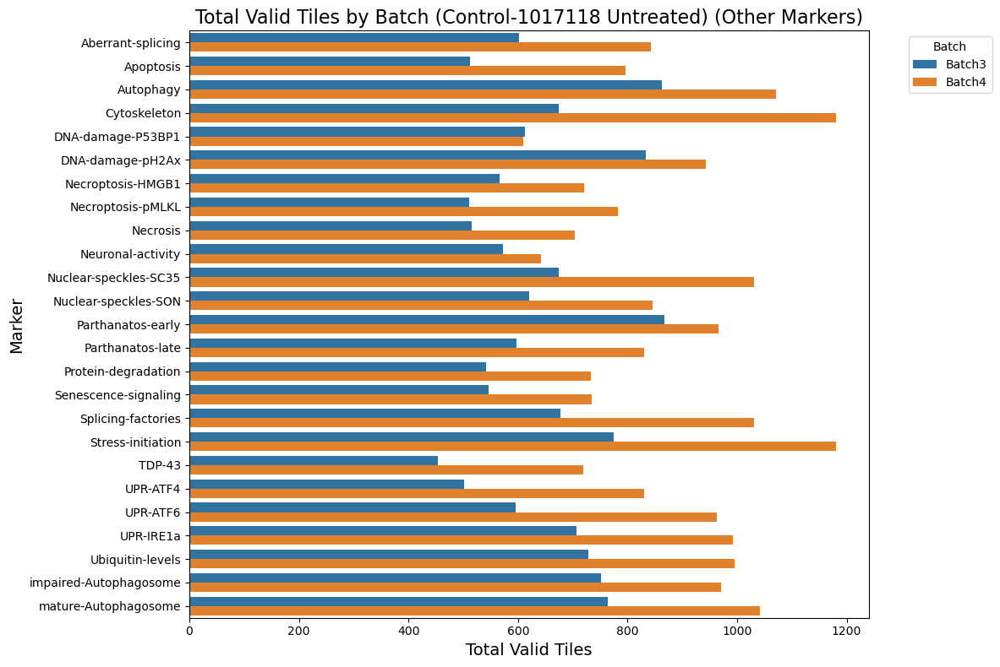

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


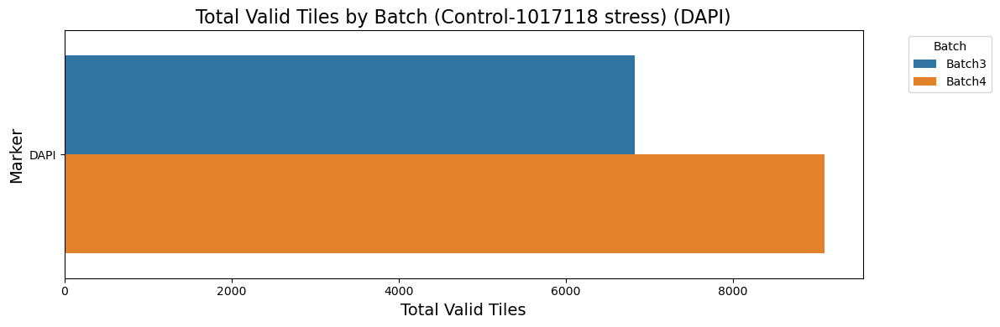

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


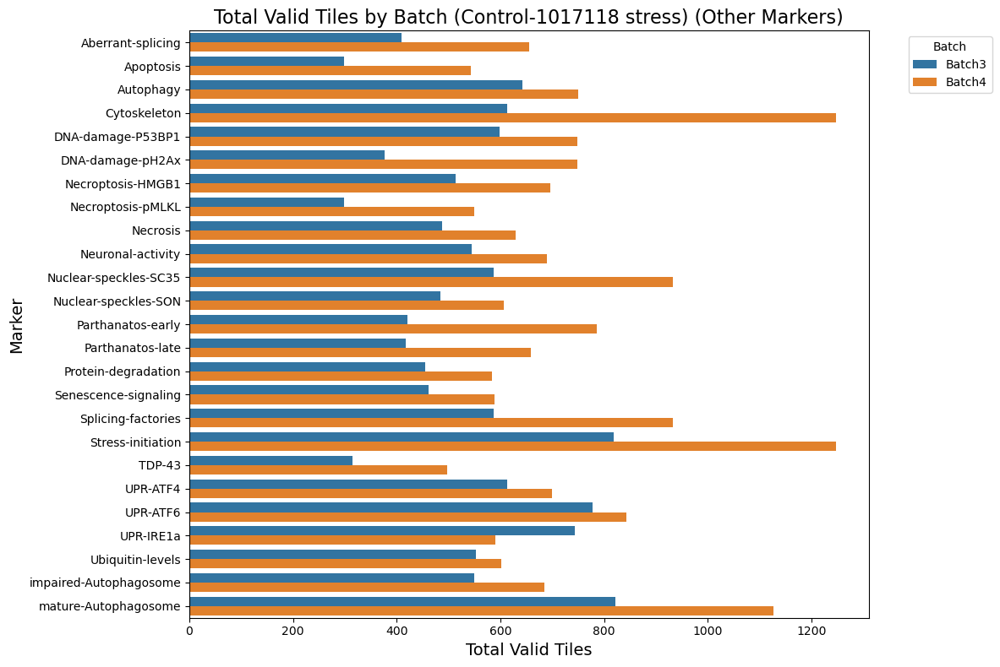

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


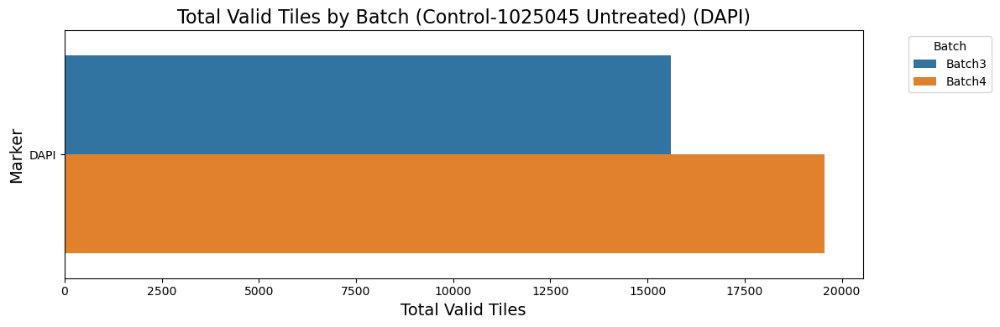

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


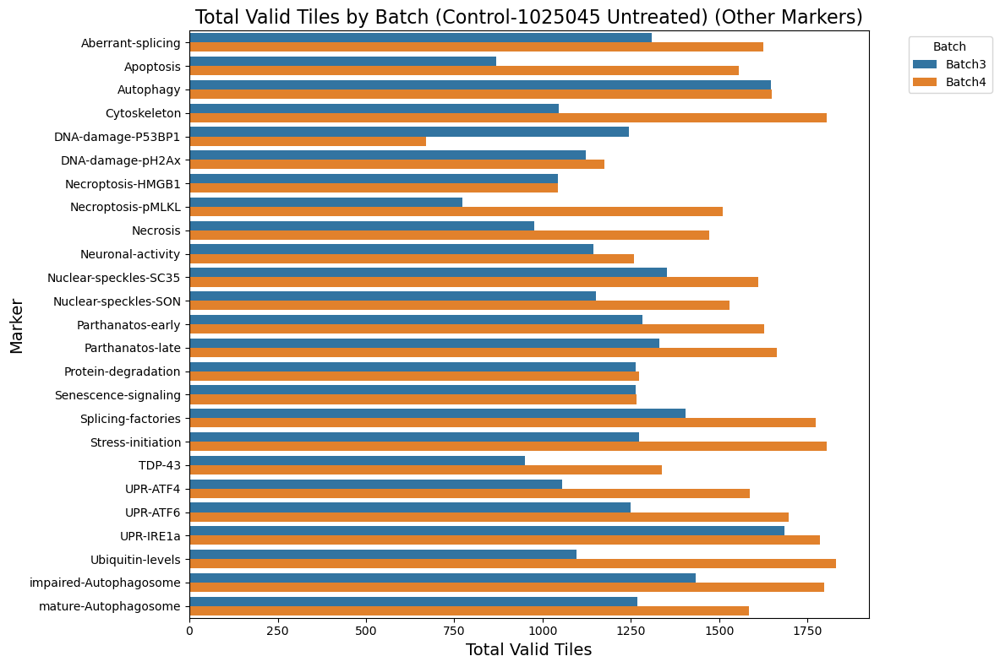

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


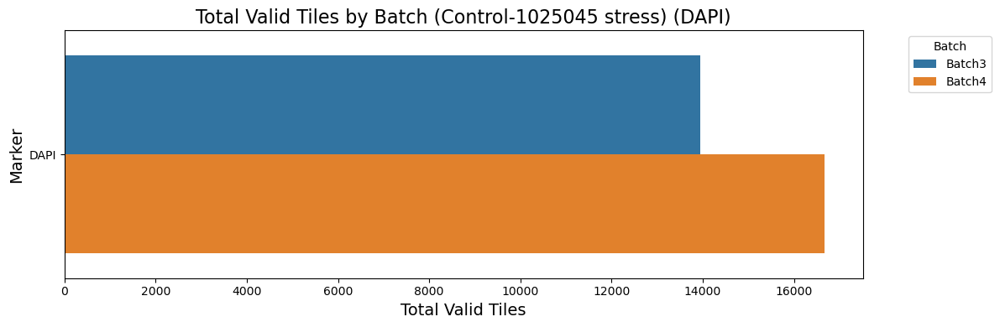

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


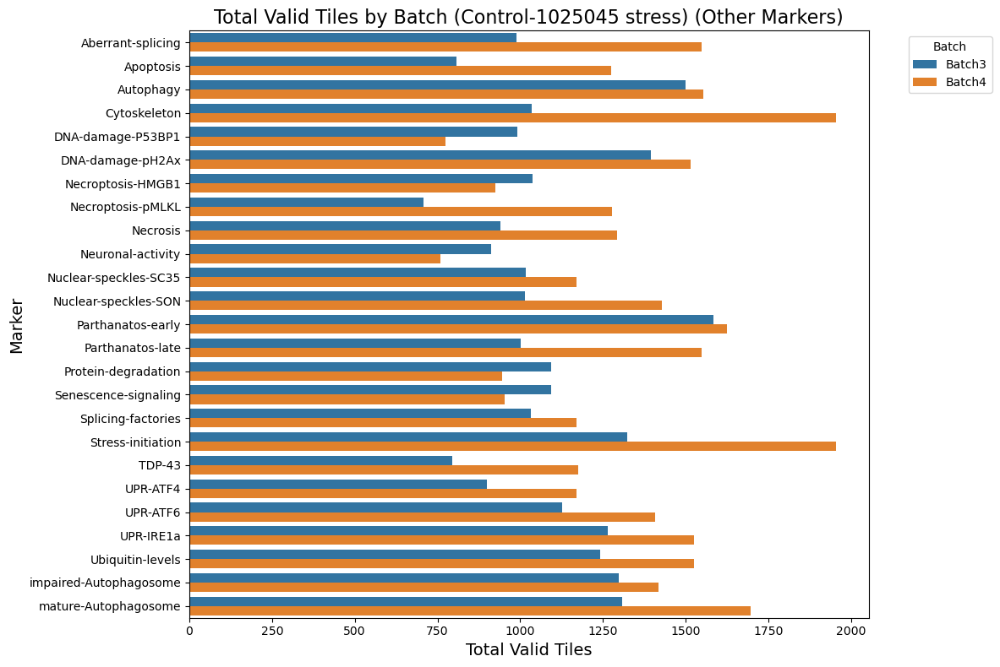

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


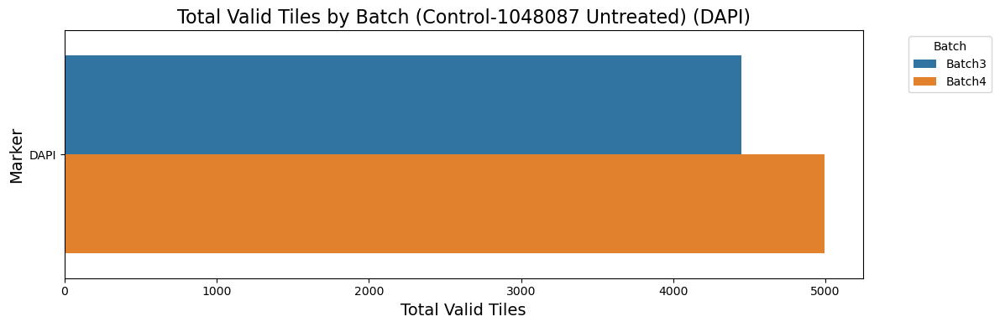

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


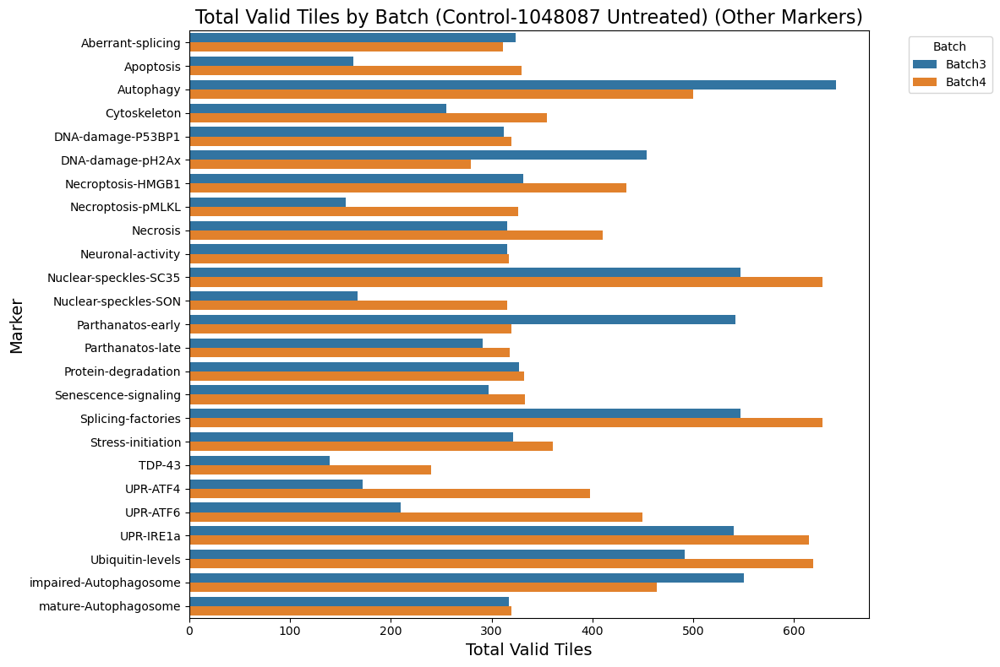

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


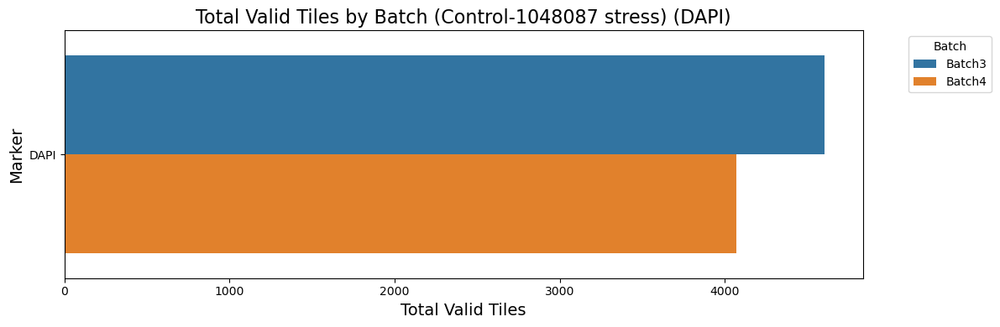

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


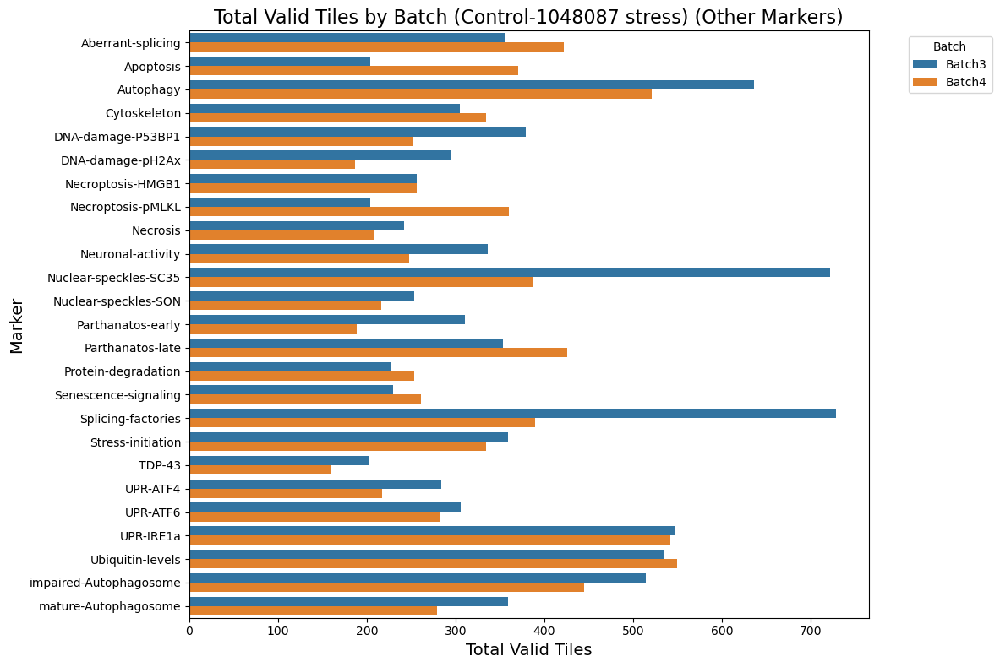

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


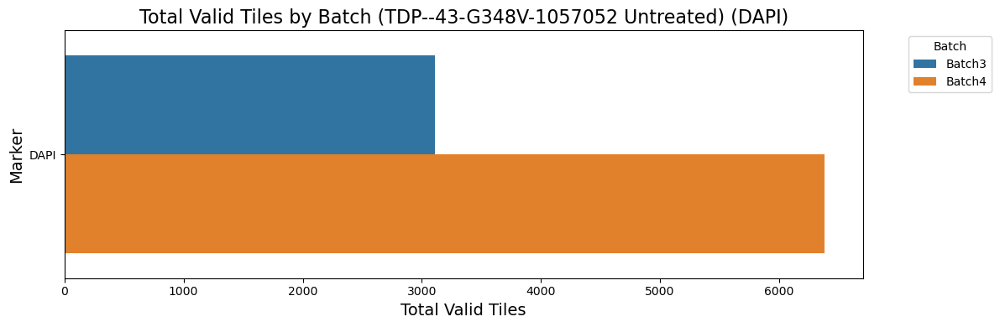

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


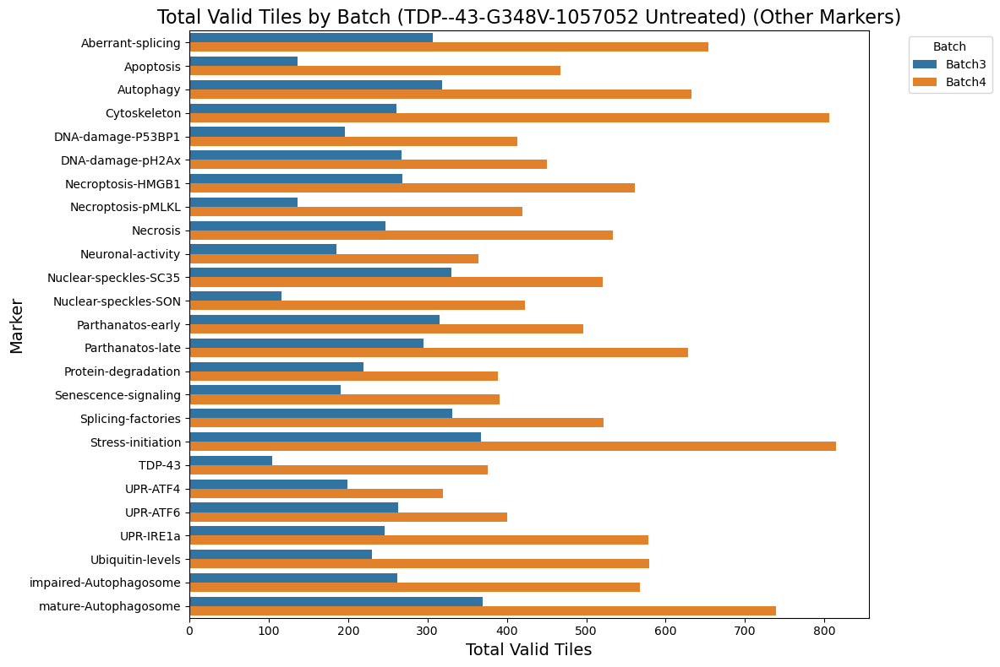

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


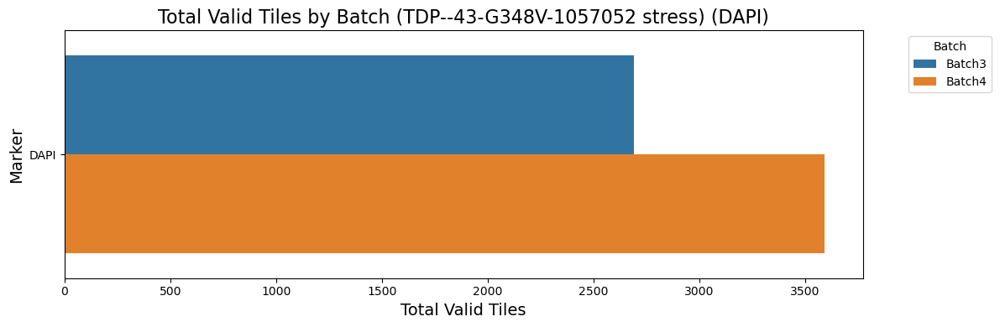

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


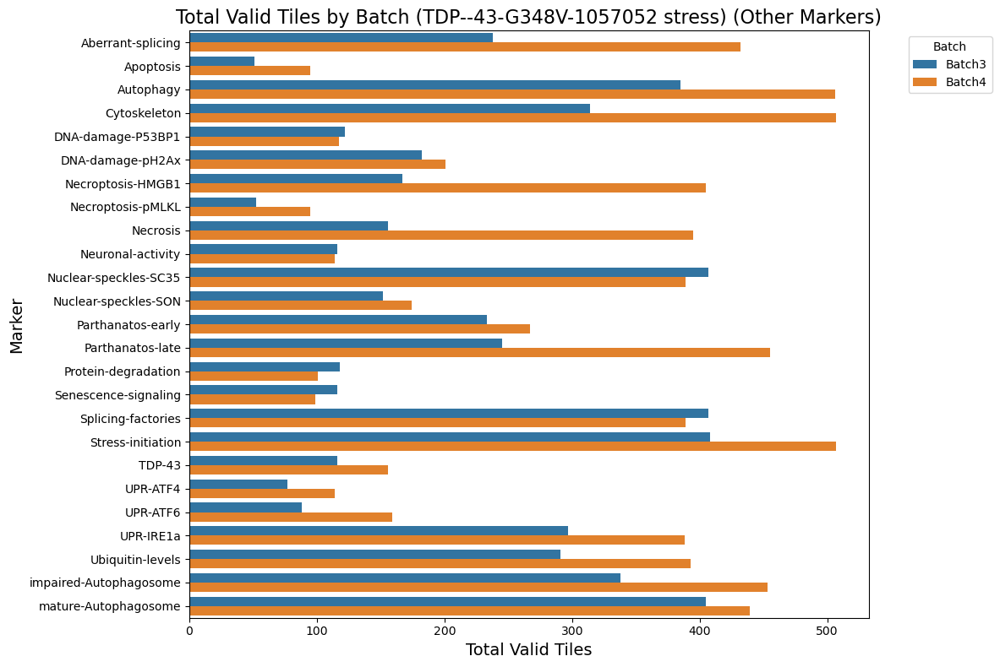

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


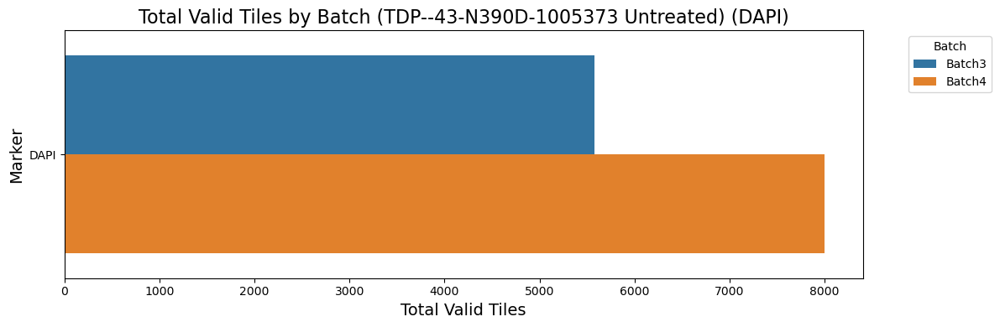

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


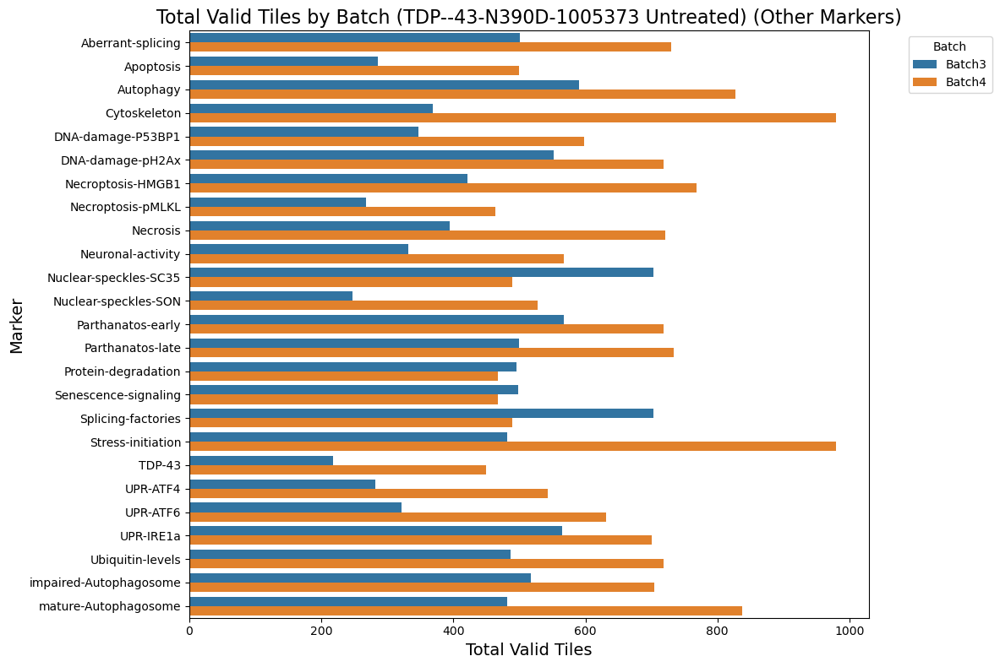

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


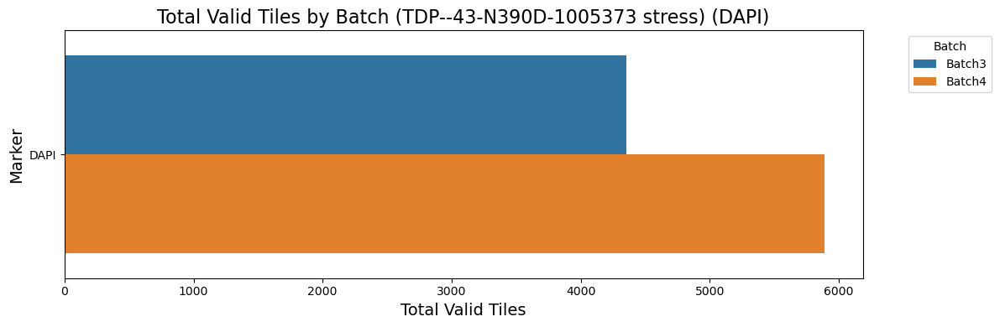

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


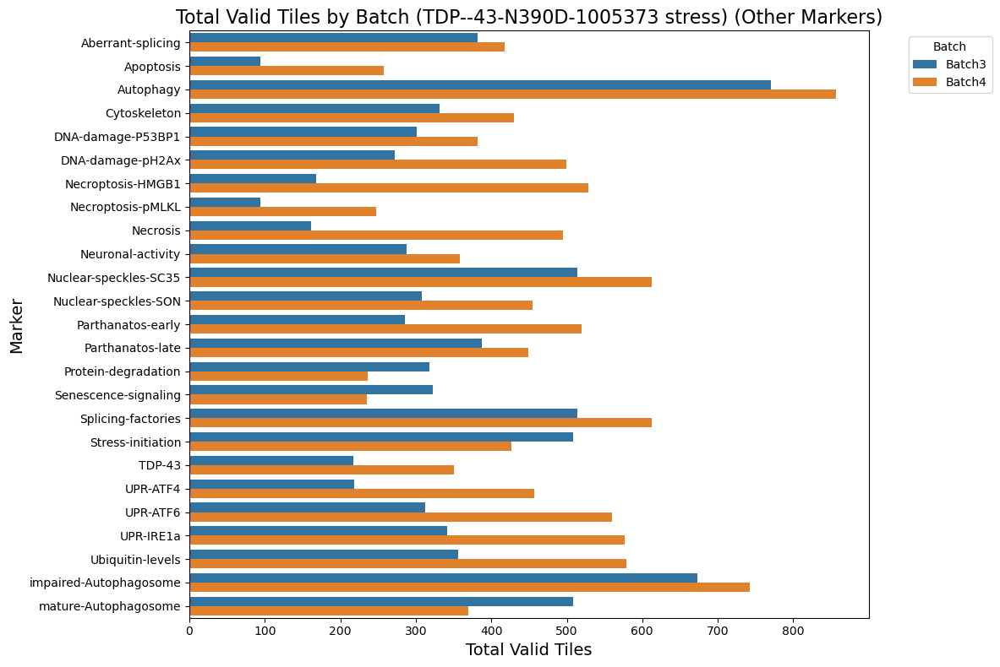

In [27]:
plot_marker_data(total_sum, split_by_cell_line=True)

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


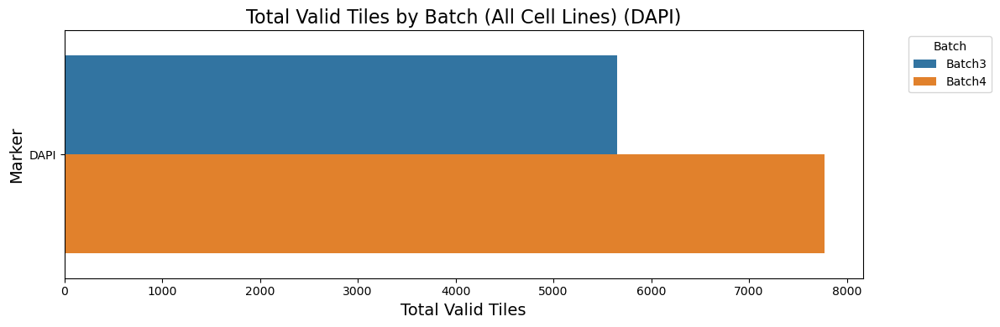

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1351: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


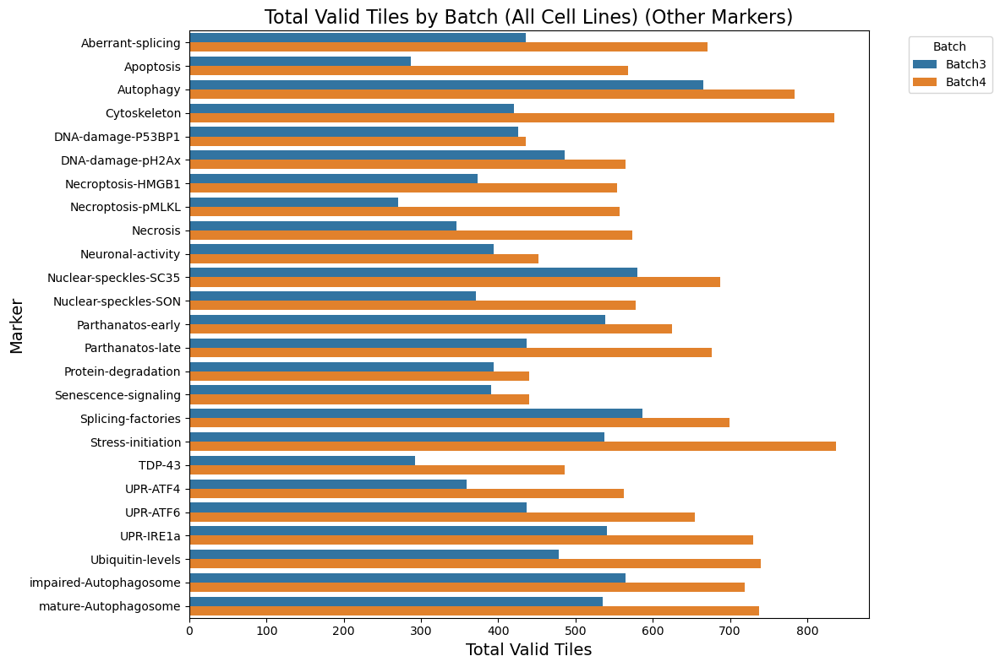

In [28]:
plot_marker_data(total_sum, split_by_cell_line=False)

### Total tiles

In [29]:
total_sum.n_valid_tiles.sum()

642891.0

### Total whole nuclei in tiles

In [30]:
total_sum[total_sum.marker =='DAPI'].site_whole_cells_counts_sum.sum()

242511.0

### Total nuclei in sites

In [31]:
total_sum[total_sum.marker =='DAPI'].site_cell_count.sum()

701521.0

In [32]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
Batch3,,,,
count,1184.000000,1184.000000,1184.000000,1184.000000
mean,227.003378,2.270034,253.168919,745.046453
std,185.542179,1.855422,208.007482,648.425128
min,9.000000,0.090000,9.000000,19.000000
25%,84.000000,0.840000,96.750000,244.000000
50%,178.000000,1.780000,198.500000,565.000000
75%,323.250000,3.232500,355.250000,1054.000000
max,1023.000000,10.230000,1178.000000,3673.000000
sum,268772.000000,NaN,299752.000000,882135.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
Batch4,,,,
count,1184.000000,1184.000000,1184.000000,1.184000e+03
mean,315.978885,3.159789,349.445101,9.770076e+02
std,230.867914,2.308679,258.543836,7.640473e+02
min,10.000000,0.100000,10.000000,2.400000e+01
25%,133.750000,1.337500,148.000000,3.920000e+02
50%,252.000000,2.520000,278.000000,7.355000e+02
75%,450.000000,4.500000,498.500000,1.407250e+03
max,1072.000000,10.720000,1272.000000,3.604000e+03
sum,374119.000000,NaN,413743.000000,1.156777e+06


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,2368.000000,2368.000000,2368.000000,2.368000e+03
mean,271.491132,2.714911,301.307010,8.610270e+02
std,214.066373,2.140664,239.480707,7.178835e+02
min,9.000000,0.090000,9.000000,1.900000e+01
25%,104.750000,1.047500,117.000000,3.047500e+02
50%,218.000000,2.180000,238.000000,6.450000e+02
75%,382.000000,3.820000,417.250000,1.217250e+03
max,1072.000000,10.720000,1272.000000,3.673000e+03
sum,642891.000000,NaN,713495.000000,2.038912e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

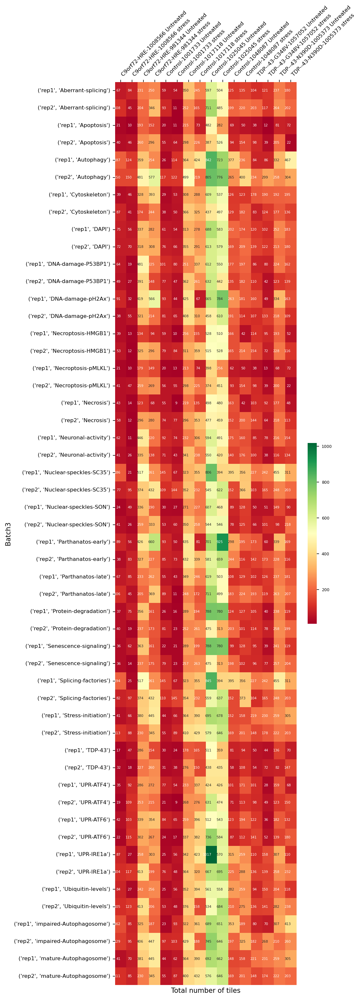

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)


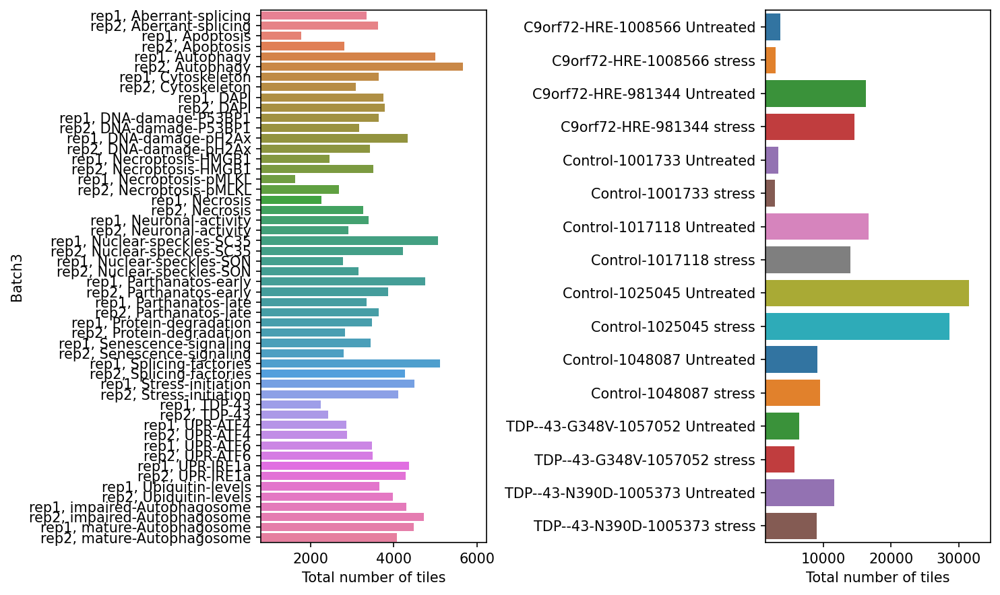

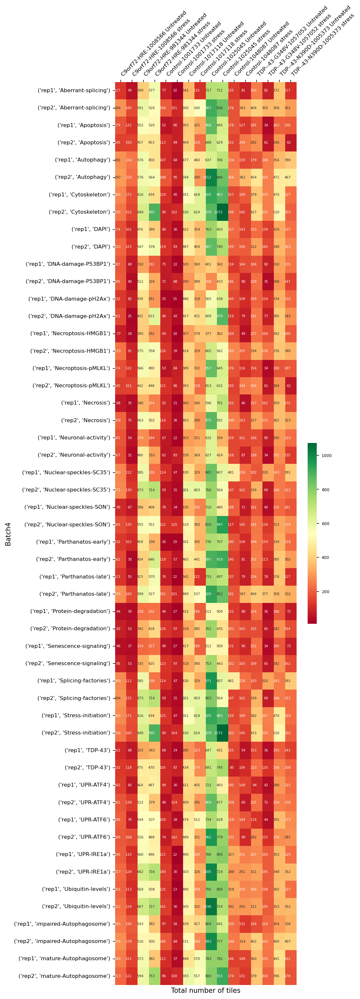

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)


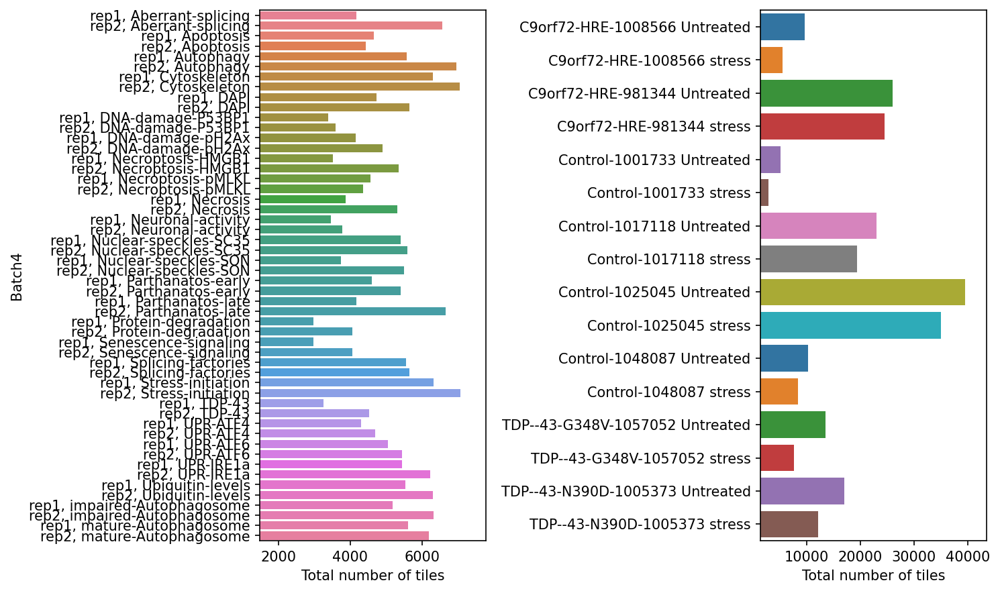

In [33]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(6,24))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

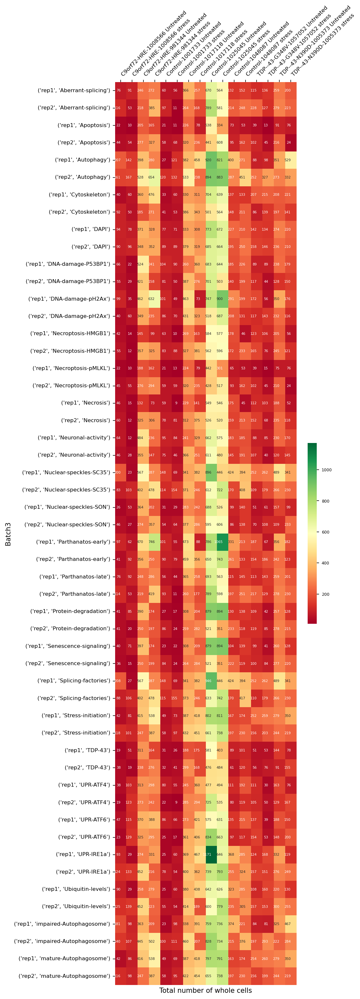

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)


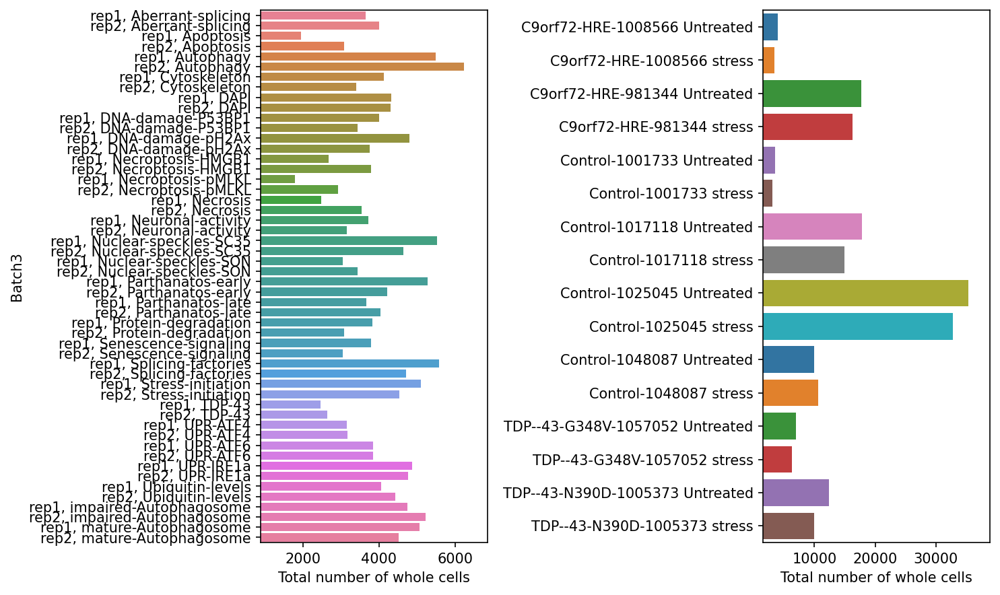

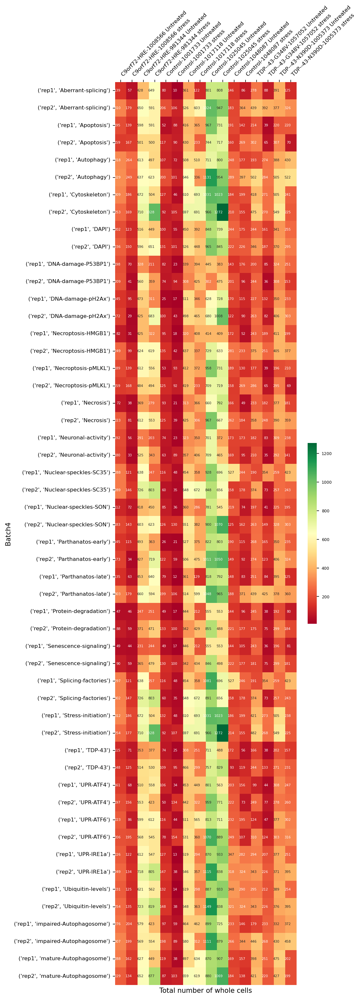

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)


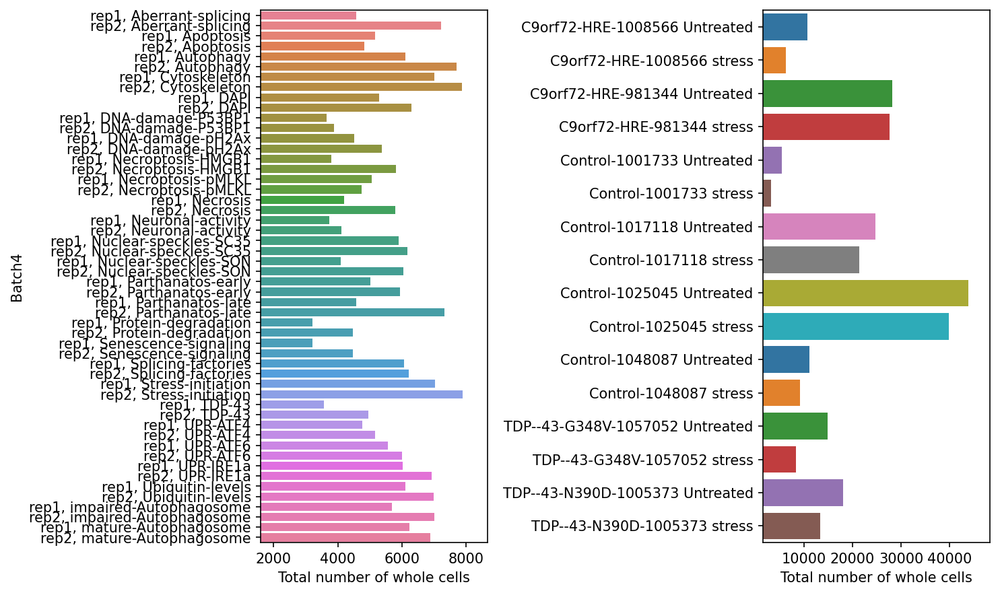

In [34]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(6,24))

### Show **Cell Count** Statistics per Batch

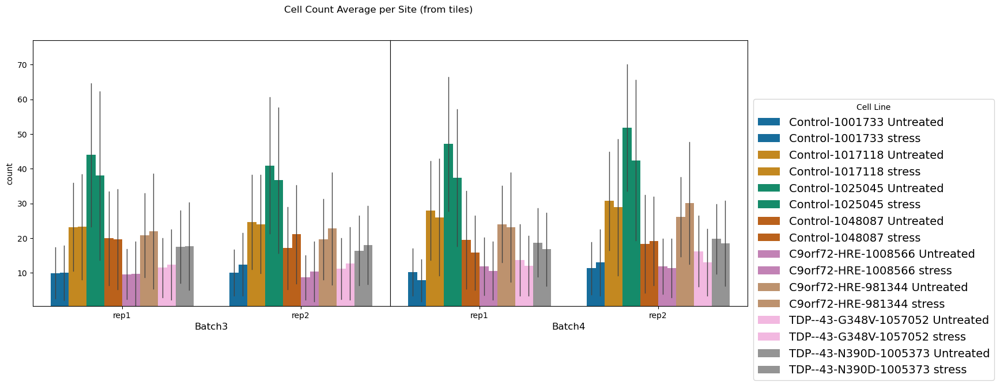

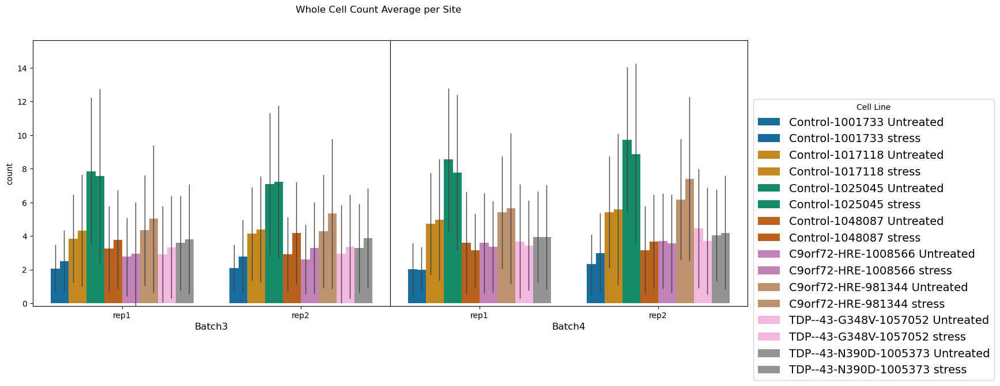

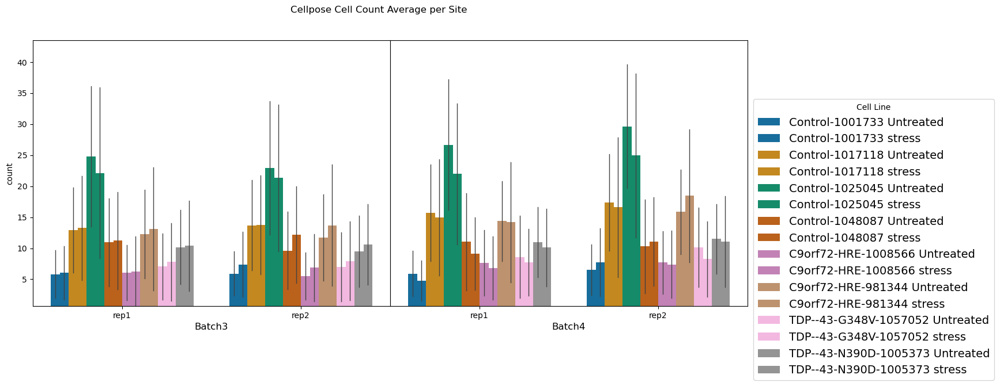

In [35]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles_after_tiles_brenner !=0]
plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)', figsize=(16,6))

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site',figsize=(16,6))

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site',figsize=(16,6))


### Show **Tiles** per Site Statistics


In [36]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles_after_tiles_brenner.mean()

cell_line_cond
C9orf72-HRE-1008566 Untreated      1.377811
C9orf72-HRE-1008566 stress         0.950359
C9orf72-HRE-981344 Untreated       4.198874
C9orf72-HRE-981344 stress          3.950221
Control-1001733 Untreated          0.868755
Control-1001733 stress             0.637314
Control-1017118 Untreated          3.947226
Control-1017118 stress             3.331172
Control-1025045 Untreated          7.347399
Control-1025045 stress             6.443509
Control-1048087 Untreated          1.981532
Control-1048087 stress             1.837889
TDP--43-G348V-1057052 Untreated    2.024302
TDP--43-G348V-1057052 stress       1.343456
TDP--43-N390D-1005373 Untreated    2.836432
TDP--43-N390D-1005373 stress       2.163921
Name: n_valid_tiles_after_tiles_brenner, dtype: float64

/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1028: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'batch_rep'] = df['batch'] + " " + df['rep']
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:1039: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  g = sns.catplot(kind='box', data=df, y=y, x=x,height=height, aspect=aspect, hue=hue, palette=palette,


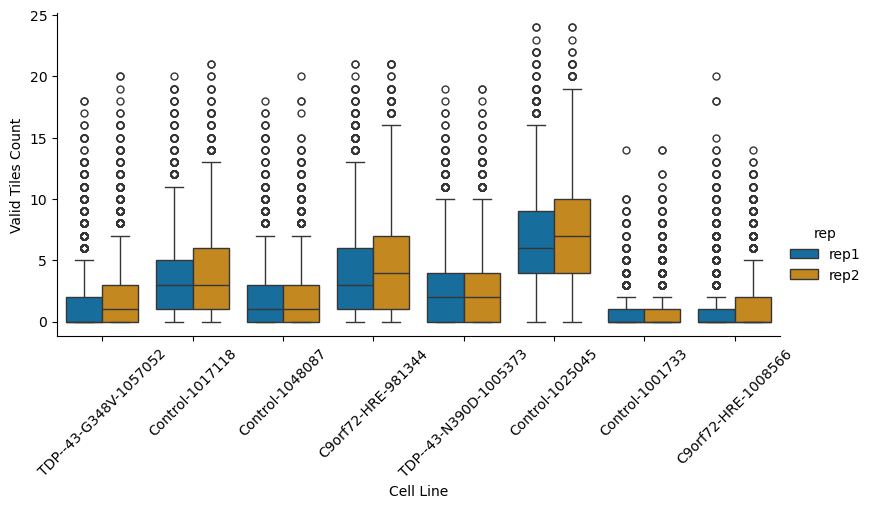

In [37]:
plot_catplot(df_dapi, sns.color_palette('colorblind'), reps=reps,x='cell_line', y_title='Valid Tiles Count', x_title='Cell Line', y='n_valid_tiles_after_tiles_brenner', hue='rep',
             height=4, aspect=2)


### Show Mean of cell count in valid tiles

In [38]:
# plot_hm(df_dapi, split_by='rep', rows='cell_line', columns='panel', vmax=3)

# Assessing Staining Reproducibility and Outliers

In [ ]:
# for batch in batches:
#     print(batch)
#     run_calc_hist_new(batch,cell_lines_for_disp, markers, root_directory_raw, root_directory_proc,
#                            hist_sample=10,sample_size_per_markers=10, ncols=4, nrows=1, figsize=(6,2))
#     print("="*30)
    

In [39]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system(f'jupyter nbconvert --to html tools/preprocessing_tools/qc_reports/qc_report_funova_exp4.ipynb --output {NOVA_HOME}/manuscript/preprocessing_qc_reports/qc_report_funova_exp4_04.03.25.html')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook tools/preprocessing_tools/qc_reports/qc_report_funova_exp4.ipynb to html
[NbConvertApp] Writing 20267261 bytes to /home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/manuscript/preprocessing_qc_reports/qc_report_funova_exp4_04.03.25.html


0